In [2]:
import pandas as pd 
import plotly.express as px
import plotly.graph_objs as go

covid_dataframe = pd.read_csv('covid_19_data.csv')
covid_dataframe.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [3]:
# Getting the information by country and date
info_by_countries = covid_dataframe.groupby(['Country/Region', 'ObservationDate']).sum().reset_index().sort_values('ObservationDate', ascending=False)
info_by_countries = info_by_countries.drop_duplicates(subset = ['Country/Region'])
info_by_countries = info_by_countries[info_by_countries['Confirmed']>0]
info_by_countries

,Country/Region,ObservationDate,SNo,Confirmed,Deaths,Recovered
894,Angola,08/29/2020,97515,2551.0,107.0,1041.0
14081,India,08/29/2020,3624235,3542733.0,63498.0,2713933.0
1244,Argentina,08/29/2020,97517,401239.0,8353.0,287220.0
29819,Switzerland,08/29/2020,97657,41722.0,2005.0,35200.0
23024,North Macedonia,08/29/2020,97625,14293.0,596.0,11014.0
...,...,...,...,...,...,...
32910,Vatican City,03/09/2020,4507,1.0,0.0,0.0
23635,Palestine,03/09/2020,4322,22.0,0.0,0.0
25087,Republic of Ireland,03/08/2020,4067,21.0,0.0,0.0
22838,North Ireland,02/28/2020,2685,1.0,0.0,0.0


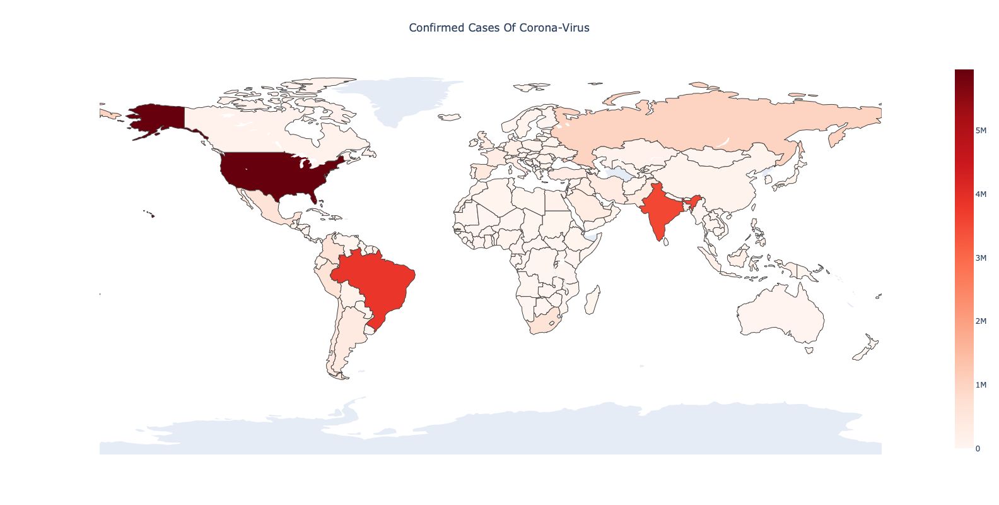

In [7]:
# Get the confirmed cases of Corono-Virus when hovered on a country and also the intensity

fig = go.Figure(data=go.Choropleth(
    locations = info_by_countries['Country/Region'],
    locationmode = 'country names',
    z = info_by_countries['Confirmed'],
    colorscale = 'Reds',
))
fig.update_layout(
    title_text = 'Confirmed Cases Of Corona-Virus',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
        projection_type = 'equirectangular'
    ),
    width=1000,
    height=800
)

In [8]:
# Get the data based on date to do the visualization based on the date
date_dataframe = covid_dataframe[covid_dataframe['Confirmed']>0]
date_dataframe = date_dataframe.groupby(['ObservationDate','Country/Region']).sum().reset_index()
date_dataframe

,ObservationDate,Country/Region,SNo,Confirmed,Deaths,Recovered
0,01/22/2020,Japan,36,2.0,0.0,0.0
1,01/22/2020,Macau,21,1.0,0.0,0.0
2,01/22/2020,Mainland China,373,547.0,17.0,28.0
3,01/22/2020,South Korea,38,1.0,0.0,0.0
4,01/22/2020,Taiwan,29,1.0,0.0,0.0
...,...,...,...,...,...,...
34028,08/29/2020,West Bank and Gaza,97674,21668.0,147.0,14631.0
34029,08/29/2020,Western Sahara,97675,10.0,1.0,8.0
34030,08/29/2020,Yemen,97676,1946.0,563.0,1113.0
34031,08/29/2020,Zambia,97677,11902.0,284.0,11092.0


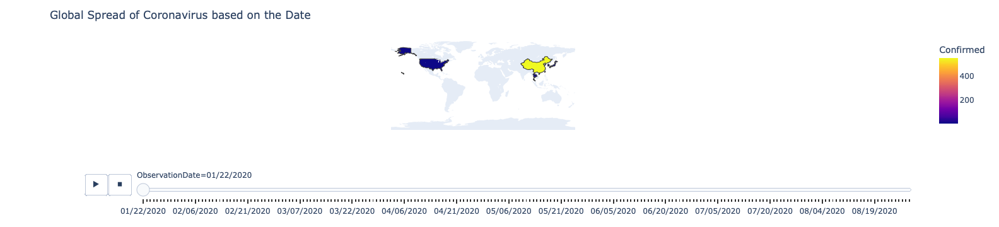

In [16]:
# visualize the covid cases by date
fig = px.choropleth(date_dataframe, 
                    locations="Country/Region", 
                    locationmode = "country names",
                    color="Confirmed", 
                    hover_name="Country/Region", 
                    animation_frame="ObservationDate"
                   )
fig.update_layout(
    title_text = 'Global Spread of Coronavirus based on the Date',
    geo=dict(
        showframe = False,
        showcoastlines = False,
    ))
    
fig.show()

In [17]:
# Getting the data based on only date to collect the info about the daily increase in different type of case

datewise=covid_dataframe.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})

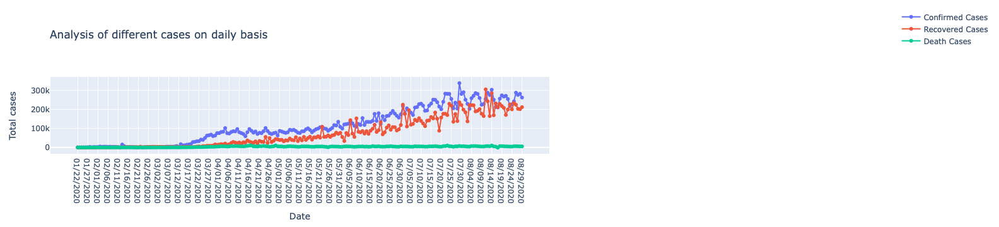

In [20]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=datewise.index, y=datewise["Confirmed"].diff().fillna(0),mode='lines+markers',
                    name='Confirmed Cases'))
fig.add_trace(go.Scatter(x=datewise.index, y=datewise["Recovered"].diff().fillna(0),mode='lines+markers',
                    name='Recovered Cases'))
fig.add_trace(go.Scatter(x=datewise.index, y=datewise["Deaths"].diff().fillna(0),mode='lines+markers',
                    name='Death Cases'))
fig.update_layout(title="Analysis of different cases on daily basis",
                 xaxis_title="Date",yaxis_title="Total cases",legend=dict(x=1.7,y=1.9,traceorder="normal"))
fig.show()

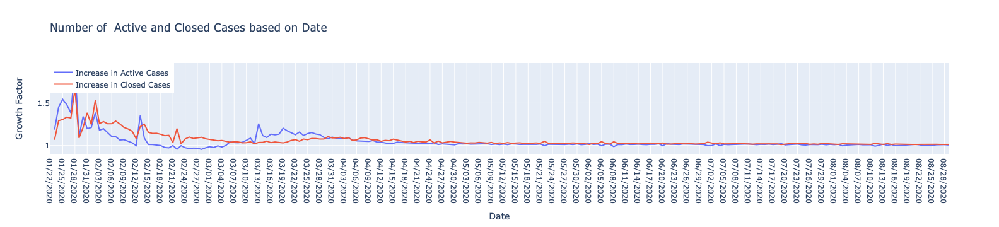

In [21]:
# Number of active and closed case

fig=go.Figure()
fig.add_trace(go.Scatter(x=datewise.index, 
                         y=(datewise["Confirmed"]-datewise["Recovered"]-datewise["Deaths"])/(datewise["Confirmed"]-datewise["Recovered"]-datewise["Deaths"]).shift(),
                    mode='lines',
                    name='Increase in Active Cases'))
fig.add_trace(go.Scatter(x=datewise.index, y=(datewise["Recovered"]+datewise["Deaths"])/(datewise["Recovered"]+datewise["Deaths"]).shift(),
                    mode='lines',
                    name='Increase in Closed Cases'))
fig.update_layout(title="Number of  Active and Closed Cases based on Date",
                 xaxis_title="Date",yaxis_title="Growth Factor",
                 legend=dict(x=0,y=1,traceorder="normal"))
fig.show()

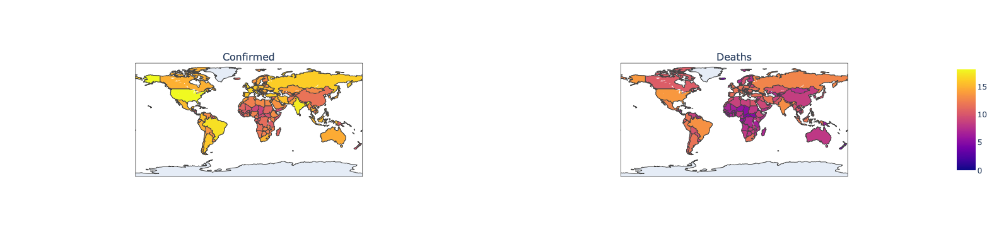

In [50]:
import numpy as np
from plotly.subplots import make_subplots


countrywise = pd.read_csv('countrywise.csv')
temp = covid_dataframe_lat[covid_dataframe_lat['Date']==max(covid_dataframe_lat['Date'])]
fig_c = px.choropleth(countrywise, locations='Country',locationmode='country names',
                     color = np.log(countrywise['Confirmed']), hover_name = 'Country',
                     hover_data = ['Confirmed'])
death_info= countrywise[countrywise['Deaths']>0]
fig_d = px.choropleth(death_info, locations='Country',locationmode='country names',
                     color = np.log(death_info['Deaths']), hover_name = 'Country',
                     hover_data = ['Deaths'])

fig = make_subplots(rows = 1, cols = 2, subplot_titles= ['Confirmed','Deaths'],
                   specs = [[{'type': 'choropleth'},{'type':'choropleth'}]])

fig.add_trace(fig_c['data'][0], row = 1, col = 1)
fig.add_trace(fig_d['data'][0], row = 1, col = 2)

fig.show()

In [47]:
# Tree analysis for confirmed and Death Cases

covid_dataframe_lat['Date']= pd.to_datetime(covid_dataframe_lat['Date'])
covid_dataframe_lat['Province/State']= covid_dataframe_lat['Province/State'].fillna("")

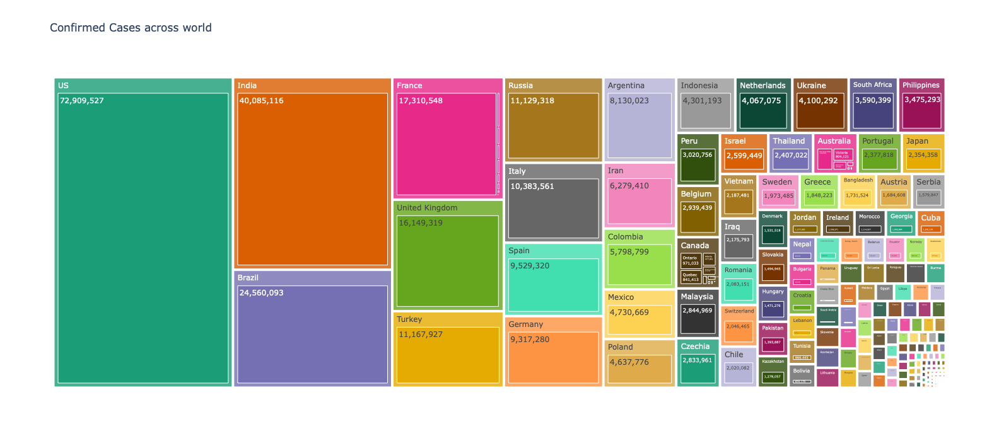

In [53]:
recent_info_confirmed = covid_dataframe_lat[covid_dataframe_lat['Date'] == max (covid_dataframe_lat['Date'])]


plot = px.treemap(recent_info_confirmed.sort_values(by = 'Confirmed', ascending = False).reset_index(drop = True),
                 path = ['Country', 'Province/State'], values = 'Confirmed', height = 700,
                 title = 'Confirmed Cases across world',
                  color_discrete_sequence = px.colors.qualitative.Dark2)

plot.data[0].textinfo = 'label+text+value'
plot.show()

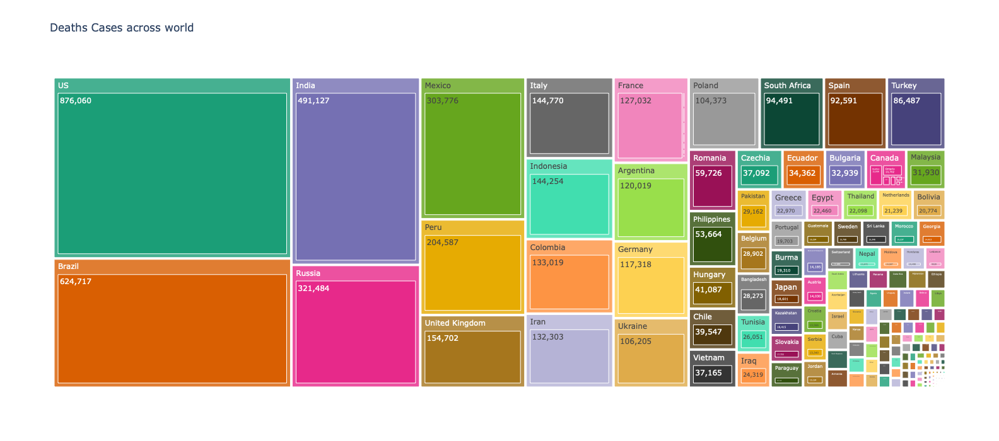

In [54]:
recent_info_death = covid_dataframe_lat[covid_dataframe_lat['Date'] == max(covid_dataframe_lat['Date'])]

plot = px.treemap(recent_info_death.sort_values(by = 'Deaths', ascending = False).reset_index(drop = True),
                 path = ['Country', 'Province/State'], values = 'Deaths', height = 700,
                 title = 'Deaths Cases across world',
                  color_discrete_sequence = px.colors.qualitative.Dark2)

plot.data[0].textinfo = 'label+text+value'
plot.show()

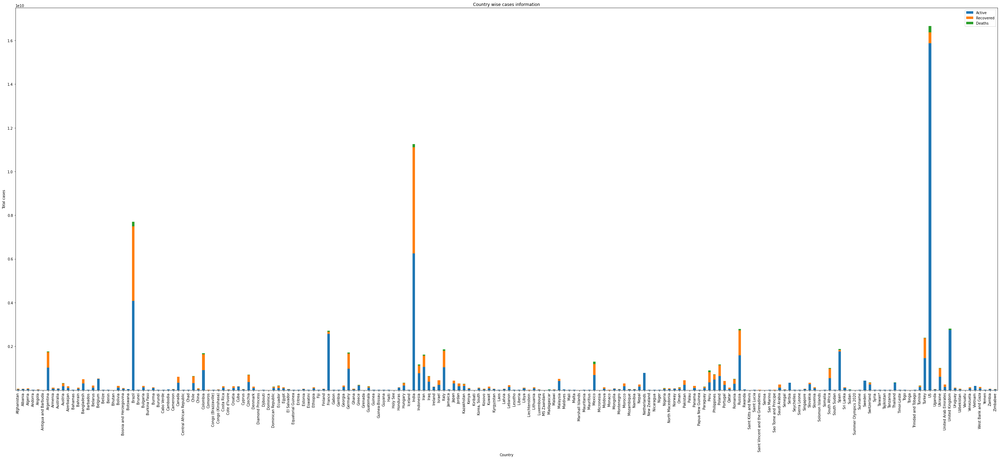

In [56]:
import matplotlib.pyplot as plt

df_country_info = covid_dataframe_lat.groupby(['Country'])[['Active', 'Recovered', 'Deaths']].sum().reset_index()
df_country_info.plot(kind='bar', stacked=True, x='Country', figsize=(50,20))
plt.xlabel('Country')
plt.ylabel('Total cases')
plt.title('Country wise cases information')
plt.show()


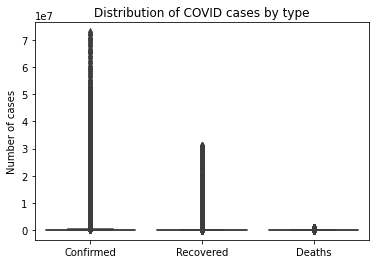

In [57]:
# In general the confirmed V/s Death V/s Recovered
import seaborn as sns

df_box = covid_dataframe_lat[['Confirmed', 'Recovered', 'Deaths']]
sns.boxplot(data=df_box)
plt.ylabel('Number of cases')
plt.title('Distribution of COVID cases by type')
plt.show()


In [58]:
# vaccinated people information 
import pandas as pd
import plotly.express as px
import pycountry

# Load the data
df = pd.read_csv('country_vaccinations.csv')


populations = {}
for country in pycountry.countries:
    try:
        populations[country.alpha_3] = country.population
    except AttributeError:
        pass

# create a population column
df['population'] = df['iso_code'].map(populations)

# number of people who have still not been vaccinated
df['people_remaining'] = df['population'] - df['people_vaccinated']


fig = px.choropleth(df, 
                    locations='iso_code', 
                    color='people_vaccinated_per_hundred', 
                    hover_name='country', 
                    hover_data=['people_vaccinated', 'people_fully_vaccinated', 'people_remaining'], 
                    projection='mercator')

# Set the title and axis labels
fig.update_layout(title='COVID-19 Vaccinations by Country', 
                  geo=dict(showframe=False, showcoastlines=False, projection_type='mercator'))

# Display the map
fig.show()


In [25]:
from datetime import datetime, timedelta
now = datetime.utcnow() - timedelta(hours=19)
days_ago = (now - timedelta(days=7)).strftime("%Y-%m-%d")
original_country_df = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/vaccinations/vaccinations.csv")
original_country_df = original_country_df.loc[~original_country_df['iso_code'].str.contains('OWID')]
original_country_df.reset_index(drop=True, inplace=True)
original_country_df.reset_index(inplace=True)
for loc in original_country_df['location'].unique():
    loc_ser = original_country_df.loc[original_country_df['location'] == loc].iloc[0]
    index = loc_ser['index']
    original_country_df.loc[index] = loc_ser.fillna(0)

original_country_df.fillna(method="ffill", inplace=True)
original_country_df.fillna(0, inplace=True)


In [26]:
original_country_df['one_dose'] = original_country_df['people_vaccinated'] - original_country_df['people_fully_vaccinated']
original_country_df['one_dose_per_hundred'] = (original_country_df['people_vaccinated_per_hundred'] - original_country_df['people_fully_vaccinated_per_hundred']).round(2)
original_country_df['population'] = (original_country_df['people_fully_vaccinated']/original_country_df['people_fully_vaccinated_per_hundred'].replace(0, 1)*100).astype(int)
original_country_df['how_many_more_vaccines'] = (2*(original_country_df['population'] - original_country_df['people_vaccinated']) + original_country_df['one_dose']).astype(int)
original_country_df['days_until_done'] = (original_country_df['how_many_more_vaccines']/original_country_df['daily_vaccinations'].replace(0, 1)).round(2)
original_country_df.head()

,index,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,...,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,one_dose,one_dose_per_hundred,population,how_many_more_vaccines,days_until_done
0,0,Afghanistan,AFG,2021-02-22,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0,0,0.0
1,1,Afghanistan,AFG,2021-02-23,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0
2,2,Afghanistan,AFG,2021-02-24,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0
3,3,Afghanistan,AFG,2021-02-25,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0
4,4,Afghanistan,AFG,2021-02-26,0.0,0.0,0.0,0.0,0.0,1367.0,...,0.0,0.0,33.0,1367.0,0.003,0.0,0.0,0,0,0.0


In [28]:
priority_list = ["United States", "Russia", "India", "China", "France", "United Kingdom", "Germany",                "Japan", "Canada", "Australia"]

country_df = original_country_df.loc[original_country_df['date'] == days_ago]
country_df.sort_values("total_vaccinations", ascending=False, inplace=True)

priority_ser_list = []
for country in priority_list:
    priority_ser = country_df.loc[country_df['location'] == country]
    if len(priority_ser) > 0:
        priority_ser_list.append(priority_ser.iloc[0])

priority_df = pd.DataFrame(priority_ser_list)
not_priority_df = country_df.loc[~country_df['location'].isin(priority_list)]

country_df = priority_df.append(not_priority_df)
country_df.head()

/var/folders/s6/3zpv69vn7939njdmq8qdwbrm0000gn/T/ipykernel_3869/2913060172.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/s6/3zpv69vn7939njdmq8qdwbrm0000gn/T/ipykernel_3869/2913060172.py:15: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,index,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,...,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million,daily_people_vaccinated,daily_people_vaccinated_per_hundred,one_dose,one_dose_per_hundred,population,how_many_more_vaccines,days_until_done
113091,113091,Russia,RUS,2023-04-19,1.866396e+08,8.879487e+07,79700511.0,20383018.0,71260.0,220.0,...,55.07,14.09,2.0,167.0,0.0,9094355.0,6.29,144725823,120956269,549801.22
63288,63288,India,IND,2023-04-19,2.206600e+09,1.027403e+09,951965463.0,227232099.0,512.0,497.0,...,67.17,16.03,0.0,133.0,0.0,75437370.0,5.33,1417247972,855127648,1720578.77
48385,48385,France,FRA,2023-04-19,1.544261e+08,5.467056e+07,53183543.0,47654393.0,1143.0,1234.0,...,78.43,70.27,18.0,108.0,0.0,1487019.0,2.19,67810204,27766303,22501.06
70148,70148,Japan,JPN,2023-04-19,3.835794e+08,1.046999e+08,103373465.0,175506003.0,6058.0,9597.0,...,83.40,141.59,77.0,287.0,0.0,1326480.0,1.07,123948998,39824586,4149.69
11668,11668,Bangladesh,BGD,2023-04-19,3.579821e+08,1.513194e+08,139777975.0,67466257.0,76144.0,1858.0,...,81.65,39.41,11.0,148.0,0.0,11541396.0,6.74,171191641,51285936,27602.76


In [30]:
country_abbrev = {
'Afghanistan': 'AFG',
 'Albania': 'ALB',
 'Algeria': 'DZA',
 'American Samoa': 'ASM',
 'Andorra': 'AND',
 'Angola': 'AGO',
 'Anguilla': 'AIA',
 'Antigua and Barbuda': 'ATG',
 'Argentina': 'ARG',
 'Armenia': 'ARM',
 'Aruba': 'ABW',
 'Australia': 'AUS',
 'Austria': 'AUT',
 'Azerbaijan': 'AZE',
 'Bahamas, The': 'BHM',
 'Bahrain': 'BHR',
 'Bangladesh': 'BGD',
 'Barbados': 'BRB',
 'Belarus': 'BLR',
 'Belgium': 'BEL',
 'Belize': 'BLZ',
 'Benin': 'BEN',
 'Bermuda': 'BMU',
 'Bhutan': 'BTN',
 'Bolivia': 'BOL',
 'Bosnia and Herzegovina': 'BIH',
 'Botswana': 'BWA',
 'Brazil': 'BRA',
 'British Virgin Islands': 'VGB',
 'Brunei': 'BRN',
 'Bulgaria': 'BGR',
 'Burkina Faso': 'BFA',
 'Burma': 'MMR',
 'Burundi': 'BDI',
 'Cabo Verde': 'CPV',
 'Cambodia': 'KHM',
 'Cameroon': 'CMR',
 'Canada': 'CAN',
 'Cayman Islands': 'CYM',
 'Central African Republic': 'CAF',
 'Chad': 'TCD',
 'Chile': 'CHL',
 'China': 'CHN',
 'Colombia': 'COL',
 'Comoros': 'COM',
 'Congo, Democratic Republic of the': 'COD',
 'Congo, Republic of the': 'COG',
 'Cook Islands': 'COK',
 'Costa Rica': 'CRI',
 "Cote d'Ivoire": 'CIV',
 'Croatia': 'HRV',
 'Cuba': 'CUB',
 'Curacao': 'CUW',
 'Cyprus': 'CYP',
 'Czech Republic': 'CZE',
 'Denmark': 'DNK',
 'Djibouti': 'DJI',
 'Dominica': 'DMA',
 'Dominican Republic': 'DOM',
 'Ecuador': 'ECU',
 'Egypt': 'EGY',
 'El Salvador': 'SLV',
 'Equatorial Guinea': 'GNQ',
 'Eritrea': 'ERI',
 'Estonia': 'EST',
 'Ethiopia': 'ETH',
 'Falkland Islands (Islas Malvinas)': 'FLK',
 'Faroe Islands': 'FRO',
 'Fiji': 'FJI',
 'Finland': 'FIN',
 'France': 'FRA',
 'French Polynesia': 'PYF',
 'Gabon': 'GAB',
 'Gambia, The': 'GMB',
 'Georgia': 'GEO',
 'Germany': 'DEU',
 'Ghana': 'GHA',
 'Gibraltar': 'GIB',
 'Greece': 'GRC',
 'Greenland': 'GRL',
 'Grenada': 'GRD',
 'Guam': 'GUM',
 'Guatemala': 'GTM',
 'Guernsey': 'GGY',
 'Guinea-Bissau': 'GNB',
 'Guinea': 'GIN',
 'Guyana': 'GUY',
 'Haiti': 'HTI',
 'Honduras': 'HND',
 'Hong Kong': 'HKG',
 'Hungary': 'HUN',
 'Iceland': 'ISL',
 'India': 'IND',
 'Indonesia': 'IDN',
 'Iran': 'IRN',
 'Iraq': 'IRQ',
 'Ireland': 'IRL',
 'Isle of Man': 'IMN',
 'Israel': 'ISR',
 'Italy': 'ITA',
 'Jamaica': 'JAM',
 'Japan': 'JPN',
 'Jersey': 'JEY',
 'Jordan': 'JOR',
 'Kazakhstan': 'KAZ',
 'Kenya': 'KEN',
 'Kiribati': 'KIR',
 'Korea, North': 'PRK',
 'Korea, South': 'KOR',
 'Kosovo': 'KSV',
 'Kuwait': 'KWT',
 'Kyrgyzstan': 'KGZ',
 'Laos': 'LAO',
 'Latvia': 'LVA',
 'Lebanon': 'LBN',
 'Lesotho': 'LSO',
 'Liberia': 'LBR',
 'Libya': 'LBY',
 'Liechtenstein': 'LIE',
 'Lithuania': 'LTU',
 'Luxembourg': 'LUX',
 'Macau': 'MAC',
 'Macedonia': 'MKD',
 'Madagascar': 'MDG',
 'Malawi': 'MWI',
 'Malaysia': 'MYS',
 'Maldives': 'MDV',
 'Mali': 'MLI',
 'Malta': 'MLT',
 'Marshall Islands': 'MHL',
 'Mauritania': 'MRT',
 'Mauritius': 'MUS',
 'Mexico': 'MEX',
 'Micronesia, Federated States of': 'FSM',
 'Moldova': 'MDA',
 'Monaco': 'MCO',
 'Mongolia': 'MNG',
 'Montenegro': 'MNE',
 'Morocco': 'MAR',
 'Mozambique': 'MOZ',
 'Namibia': 'NAM',
 'Nepal': 'NPL',
 'Netherlands': 'NLD',
 'New Caledonia': 'NCL',
 'New Zealand': 'NZL',
 'Nicaragua': 'NIC',
 'Nigeria': 'NGA',
 'Niger': 'NER',
 'Niue': 'NIU',
 'Northern Mariana Islands': 'MNP',
 'Norway': 'NOR',
 'Oman': 'OMN',
 'Pakistan': 'PAK',
 'Palau': 'PLW',
 'Panama': 'PAN',
 'Papua New Guinea': 'PNG',
 'Paraguay': 'PRY',
 'Peru': 'PER',
 'Philippines': 'PHL',
 'Poland': 'POL',
 'Portugal': 'PRT',
 'Puerto Rico': 'PRI',
 'Qatar': 'QAT',
 'Romania': 'ROU',
 'Russia': 'RUS',
 'Rwanda': 'RWA',
 'Saint Kitts and Nevis': 'KNA',
 'Saint Lucia': 'LCA',
 'Saint Martin': 'MAF',
 'Saint Pierre and Miquelon': 'SPM',
 'Saint Vincent and the Grenadines': 'VCT',
 'Samoa': 'WSM',
 'San Marino': 'SMR',
 'Sao Tome and Principe': 'STP',
 'Saudi Arabia': 'SAU',
 'Senegal': 'SEN',
 'Serbia': 'SRB',
 'Seychelles': 'SYC',
 'Sierra Leone': 'SLE',
 'Singapore': 'SGP',
 'Sint Maarten': 'SXM',
 'Slovakia': 'SVK',
 'Slovenia': 'SVN',
 'Solomon Islands': 'SLB',
 'Somalia': 'SOM',
 'South Africa': 'ZAF',
 'South Sudan': 'SSD',
 'Spain': 'ESP',
 'Sri Lanka': 'LKA',
 'Sudan': 'SDN',
 'Suriname': 'SUR',
 'Swaziland': 'SWZ',
 'Sweden': 'SWE',
 'Switzerland': 'CHE',
 'Syria': 'SYR',
 'Taiwan': 'TWN',
 'Tajikistan': 'TJK',
 'Tanzania': 'TZA',
 'Thailand': 'THA',
 'Timor-Leste': 'TLS',
 'Togo': 'TGO',
 'Tonga': 'TON',
 'Trinidad and Tobago': 'TTO',
 'Tunisia': 'TUN',
 'Turkey': 'TUR',
 'Turkmenistan': 'TKM',
 'Tuvalu': 'TUV',
 'Uganda': 'UGA',
 'Ukraine': 'UKR',
 'United Arab Emirates': 'ARE',
 'United Kingdom': 'GBR',
 'United States': 'USA',
 'Uruguay': 'URY',
 'Uzbekistan': 'UZB',
 'Vanuatu': 'VUT',
 'Venezuela': 'VEN',
 'Vietnam': 'VNM',
 'Virgin Islands': 'VGB',
 'West Bank': 'WBG',
 'Yemen': 'YEM',
 'Zambia': 'ZMB',
 'Zimbabwe': 'ZWE'
}

In [31]:
not_included_list = []
for name in country_abbrev:
    code = country_abbrev[name]
    if code not in country_df['iso_code'].unique():
        not_included_list.append(name)
        
print(f"Countries without data: {not_included_list}")

Countries without data: ['Albania', 'Algeria', 'American Samoa', 'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda', 'Armenia', 'Australia', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'British Virgin Islands', 'Brunei', 'Burkina Faso', 'Burma', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Cayman Islands', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo, Democratic Republic of the', 'Congo, Republic of the', 'Cook Islands', 'Costa Rica', "Cote d'Ivoire", 'Curacao', 'Cyprus', 'Denmark', 'Djibouti', 'Dominica', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Ethiopia', 'Falkland Islands (Islas Malvinas)', 'Faroe Islands', 'Fiji', 'Finland', 'French Polynesia', 'Gabon', 'Gambia, The', 'Georgia', 'Germany', 'Ghana', 'Gibraltar', 'Greenland', 'Grenada', 'Guam', 'Guatemala', 'Guernsey', 'Gu

In [32]:
def country_visualization(var, title, yaxis = 'Percentage', days_prev = 30):
    c = 0
    buttons_list = []
    base_list = [False for i in range(len(country_df))]
    for i in country_df.index:
        tmp_list = base_list.copy()
        tmp_list[c] = True
        buttons_list.append(dict(
            args=[{"visible": tmp_list}],
            label=country_df.loc[i]['location'],
            method="update"
        ))
        c += 1

    c = 0
    fig = go.Figure()
    for i in country_df.index:
        location_name = country_df.loc[i]['location']
        prev_df = original_country_df.loc[original_country_df['location'] == location_name][-days_prev:]
        fig.add_trace(go.Scatter(name=location_name, x=prev_df["date"], y=prev_df[var], visible=False if c != 0 else True))
        c += 1

    fig.update_layout(
        updatemenus=[
            dict(
                buttons=buttons_list,
                direction="down",
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0.1,
                xanchor="left",
                y=1.1,
                yanchor="top"
            ),
        ]
    )

    fig.update_layout(title={'text': f'{title} - World, Past {days_prev} Days', 'x': 0.5,
                         'xanchor': 'center', 'font': {'size': 20}}, showlegend=False, yaxis_title=f"{yaxis}")
    fig.show()

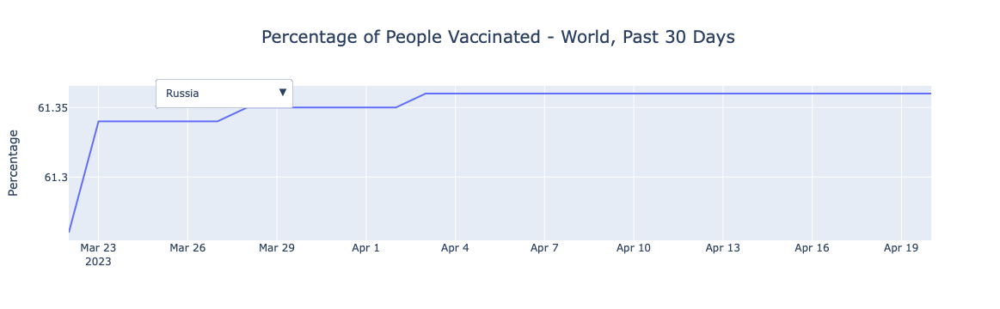

In [33]:
country_visualization('people_vaccinated_per_hundred', 'Percentage of People Vaccinated')